In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
%cd ../../..

/Users/dave/Library/CloudStorage/OneDrive-PolitecnicodiMilano/PhD/Repositories/DT-rse


## Evaluate Experiment Results

In this notebook, we test the adaptation phase of the OL routine with an offline dataset generated by the estimation routine. The idea is to validate the method and create a new faulty cluster from the outlier set.

In [2]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import os
import seaborn as sns
from pathlib import Path
from scipy import signal
import plotly.graph_objects as go
from IPython.display import display, clear_output
import time

from ernesto.postprocessing.visualization import ernesto_plotter
from ernesto.adaptation.regime_shift.stats import *

In [3]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# 1. Set the basic style
# 'paper' context sets the base font size small (approx 8-9pt). 
# Scaling it by 1.3-1.5 usually matches standard 11pt/12pt thesis text nicely.
sns.set_context("paper", font_scale=1.4) 

# 2. Define the visual style
sns.set_style('whitegrid', {
    'grid.linestyle': '--', 
    'grid.alpha': 0.5,          # Lower alpha for less intrusive grid
    'grid.color': '.8',
    'axes.edgecolor': '0.15',
    'font.family': 'serif',     # Matches LaTeX default
    'font.serif': ['Times New Roman', 'Computer Modern Roman', 'DejaVu Serif'],
})

# 3. Fine-tune Matplotlib params for Publication Quality
plt.rcParams.update({
    # Figure Size: 6x3.7 is close to the Golden Ratio for A4/Letter width
    'figure.figsize': (6.0, 3.75), 
    
    # Line width: Thicker for the main mean line
    'lines.linewidth': 2.0,     
    
    # Fonts: Ensure math looks like LaTeX
    'mathtext.fontset': 'cm',   # 'cm' = Computer Modern (LaTeX standard)
    'mathtext.rm': 'serif',
    
    # Axes and Ticks
    'axes.linewidth': 1.2,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'xtick.major.size': 4,
    'ytick.major.size': 4,
    'xtick.bottom': True,       # Ensure ticks are visible
    'ytick.left': True,
    
    # Legend: Clean and readable
    'legend.frameon': True,
    'legend.framealpha': 0.9,
    'legend.fancybox': False,   # Square corners match academic style better
    'legend.edgecolor': '0.8',
})

# 4. Color Palette: High contrast, colorblind safe
# Using 'bright' or 'colorblind' is best for distinguishing RL agents
plot_colors = sns.color_palette("colorblind")

Evolving clustering (not working!): 
- batch_size 5000
- ks 0.01
- minOutlier 30
- lambda 0.8

Evolving clustering (ok -> 1 faulty cluster): 
- batch_size 6000
- ks 0.01
- minOutlier 10
- lambda 0.8

Evolving clustering (ok -> too many faults (8)): 
- batch_size 1500
- ks 0.01
- minOutlier 30
- lambda 0.8

Evolving clustering (ok -> some faults (4)): 
- batch_size 1500
- ks 0.01
- minOutlier 30
- lambda 0.95

Evolving clustering (ok -> just 1 fault): 
- batch_size 3000
- ks 0.01
- minOutlier 30
- lambda 0.95

In [15]:
exp_type = 'single' #'single' or 'multi'
is_validation = True

if is_validation:
    #folder = f"data/output/adaptive/phdThesis/region_shift_validation/"
    folder = f"data/output/adaptive/phdThesis/prova_validation_new/"
else:
    #folder = f"data/output/adaptive/phdThesis/region_{exp_type}_shift_experiment/routine_with_noise/"
    folder = f"data/output/adaptive/phdThesis/region_{exp_type}_shift_experiment/extrapolation/"


plot_folder = folder + 'plots/'
os.makedirs(plot_folder, exist_ok=True)

folder_adaptive = folder + 'evolving-clustering-randomInit'
#folder_adaptive = folder + 'evolving-clustering-3000-30out-095lambda-noscale'
#folder_adaptive = folder + 'evolving-clustering-3000-30out-095lambda-widerBounds-randomInit'
#folder_adaptive = folder + 'evolving-clustering-3000-30out-095lambda'

path_adaptive = Path(folder_adaptive)

In [16]:
samples_file = 'parameter_evolution.csv'
ground_file = 'ground_0.csv'
sim_datasets = [f for f in os.listdir(path_adaptive) if f.startswith('dataset')]
clust_files = [f for f in os.listdir(path_adaptive) if f.startswith('cluster')]

df_samples = pd.read_csv(path_adaptive / samples_file)
df_ground = pd.read_csv(path_adaptive / ground_file)
sorted(sim_datasets)
df_sim = pd.concat((pd.read_csv(path_adaptive / f) for f in sorted(sim_datasets)), ignore_index=True)
dfs_clusters = {clust_file.split('cluster_')[1].split('.')[0]: pd.read_csv(path_adaptive / clust_file) for clust_file in clust_files}

#dfs_clusters['nominal'] = dfs_clusters.pop('cluster_nominal_temp_40.csv')
#dfs_clusters['faulty1'] = dfs_clusters.pop('cluster_faulty_1.csv')

In [17]:
#folder_passive = folder + 'passive-adaptation/'
folder_passive = folder + 'memoryless-randomInit/'
path_passive = Path(folder_passive)

samples_file = 'parameter_evolution.csv'
passive_datasets = [f for f in os.listdir(path_passive) if f.startswith('dataset')]
sorted(passive_datasets)
df_passive = pd.read_csv(path_passive / samples_file)
df_sim_passive = pd.concat((pd.read_csv(path_passive / f) for f in sorted(passive_datasets)), ignore_index=True)

In [18]:
folder_clushift = folder + 'cluster-shift/'
path_clushift = Path(folder_clushift)

samples_file = 'parameter_evolution.csv'
clushift_datasets = [f for f in os.listdir(path_clushift) if f.startswith('dataset')]
sorted(clushift_datasets)
df_clushift = pd.read_csv(path_clushift / samples_file)
df_sim_clushift = pd.concat((pd.read_csv(path_clushift / f) for f in sorted(clushift_datasets)), ignore_index=True)

FileNotFoundError: [Errno 2] No such file or directory: 'data/output/adaptive/phdThesis/prova_validation_new/cluster-shift'

In [19]:
if is_validation:
    df_real = df_ground
else:
    folder_real = folder + 'real_params/'
    path_real = Path(folder_real)

    real_datasets = [f for f in os.listdir(path_real) if f.startswith('dataset')]
    sorted(real_datasets)
    df_real = pd.concat((pd.read_csv(path_real / f) for f in sorted(real_datasets)), ignore_index=True)

In [20]:
#folder_fixed = "data/output/adaptive/"
folder_fixed = folder + 'fixed_params'
#folder_fixed = folder_fixed + 'region_shift_experiment/test_complete_routine/fixed_params/'
#folder_fixed = folder_fixed + 'region_multiple_shift_experiment/test_complete_routine/fixed_params/'
#folder_fixed = folder_fixed + 'region_shift_experiment/test_complete_routine/validation_fixed_params/'
#folder_fixed = folder_fixed + 'region_shift_experiment/test_complete_routine/validation_real_params/'
path_fixed = Path(folder_fixed)

In [21]:
fixed_datasets = [f for f in os.listdir(path_fixed) if f.startswith('dataset')]
sorted(fixed_datasets)
df_fixed = pd.concat((pd.read_csv(path_fixed / f) for f in sorted(fixed_datasets)), ignore_index=True)

FileNotFoundError: [Errno 2] No such file or directory: 'data/output/adaptive/phdThesis/prova_validation_new/fixed_params'

In [22]:
df_real

,current,voltage,t_amb,time,soc,temperature
0,20.0101,3.9984,314.1596,0.0,0.716714,313.210000
1,19.9987,4.0000,314.1596,0.1,0.716992,313.276426
2,20.0101,4.0009,314.1563,0.2,0.717020,313.336892
3,20.0032,4.0019,314.1563,0.3,0.717047,313.392998
4,19.9987,4.0022,314.1563,0.4,0.717075,313.445268
...,...,...,...,...,...,...
626306,20.0055,4.0512,290.0770,62630.6,0.665245,290.113276
626307,20.0009,4.0514,290.0787,62630.7,0.665273,290.111257
626308,20.0009,4.0515,290.0787,62630.8,0.665301,290.109492
626309,20.0101,4.0515,290.1375,62630.9,0.665329,290.107847


In [23]:
df_fixed

NameError: name 'df_fixed' is not defined

In [24]:
df_sim_passive

,time,soc,soh,c_max,voltage,current,power,v_oc,r0,r1,c1,v_r0,v_rc,i_r1,i_c,temperature,heat,t_amb,dVoc_dT
0,-1.0,0.716714,1.0,20.0,3.897220,0.0000,0.000000,0.000000,0.00183,0.002069,26290.432970,0.000000,0.000000,0.000000,0.000000,313.210000,0.000000,314.1596,-0.000007
1,0.0,0.716992,1.0,20.0,3.902636,-20.0101,78.092141,3.865270,0.00183,0.002069,26290.432970,-0.036618,-0.000747,-0.361226,-19.648874,313.276334,0.733009,314.1596,-0.000007
2,1.0,0.717020,1.0,20.0,3.902968,-19.9987,78.054293,3.865549,0.00183,0.002069,26290.432970,-0.036598,-0.000822,-0.397262,-19.601438,313.336797,0.732231,314.1596,-0.000007
3,1.1,0.717047,1.0,20.0,3.903104,-20.0101,78.101504,3.865589,0.00183,0.002069,26290.432970,-0.036618,-0.000896,-0.433252,-19.576848,313.392901,0.733128,314.1563,-0.000007
4,1.2,0.717075,1.0,20.0,3.903205,-20.0032,78.076595,3.865629,0.00183,0.002069,26290.432970,-0.036606,-0.000971,-0.469164,-19.534036,313.445169,0.732690,314.1563,-0.000007
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
626307,62631.5,0.665273,1.0,20.0,4.049035,-20.0055,81.002960,3.807367,0.01000,0.006793,7433.051555,-0.200055,-0.041612,-6.125527,-13.879973,290.111528,4.257096,290.0770,0.000012
626308,62631.6,0.665301,1.0,20.0,4.049198,-20.0009,80.987602,3.807391,0.01000,0.006793,7433.051555,-0.200009,-0.041798,-6.152951,-13.847949,290.109765,4.257543,290.0787,0.000012
626309,62631.7,0.665329,1.0,20.0,4.049407,-20.0009,80.991784,3.807414,0.01000,0.006793,7433.051555,-0.200009,-0.041984,-6.180322,-13.820578,290.108122,4.259836,290.0787,0.000012
626310,62631.8,0.665356,1.0,20.0,4.049708,-20.0101,81.035060,3.807437,0.01000,0.006793,7433.051555,-0.200101,-0.042170,-6.207657,-13.802443,290.110613,4.265818,290.1375,0.000012


In [25]:
df_sim_clushift

NameError: name 'df_sim_clushift' is not defined

In [26]:
df_sim[:100]

,time,soc,soh,c_max,voltage,current,power,v_oc,r0,r1,c1,v_r0,v_rc,i_r1,i_c,temperature,heat,t_amb,dVoc_dT
0,-1.0,0.716714,1.0,20.0,3.897220,0.0000,0.000000,0.000000,0.001830,0.002069,26290.432970,0.000000,0.000000,0.000000,0.000000,313.210000,0.000000,314.1596,-0.000007
1,0.0,0.716992,1.0,20.0,3.906809,-20.0101,78.175635,3.865270,0.002036,0.002390,24490.909512,-0.040735,-0.000803,-0.336122,-19.673978,313.276426,0.815384,314.1596,-0.000007
2,1.0,0.717020,1.0,20.0,3.907144,-19.9987,78.137805,3.865549,0.002036,0.002390,24490.909512,-0.040712,-0.000883,-0.369658,-19.629042,313.336892,0.814512,314.1596,-0.000007
3,1.1,0.717047,1.0,20.0,3.907288,-20.0101,78.185222,3.865589,0.002036,0.002390,24490.909512,-0.040735,-0.000964,-0.403155,-19.606945,313.392998,0.815502,314.1563,-0.000007
4,1.2,0.717075,1.0,20.0,3.907393,-20.0032,78.160368,3.865629,0.002036,0.002390,24490.909512,-0.040721,-0.001043,-0.436584,-19.566616,313.445268,0.815008,314.1563,-0.000007
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,10.3,0.719603,1.0,20.0,3.916700,-20.0078,78.364545,3.868199,0.002036,0.002390,24490.909512,-0.040730,-0.007770,-3.251277,-16.756523,314.157078,0.840190,314.1722,-0.000008
96,10.4,0.719631,1.0,20.0,3.916753,-19.9872,78.284918,3.868225,0.002036,0.002390,24490.909512,-0.040689,-0.007839,-3.279821,-16.707379,314.158199,0.838959,314.1722,-0.000008
97,10.5,0.719659,1.0,20.0,3.916852,-19.9895,78.295912,3.868252,0.002036,0.002390,24490.909512,-0.040693,-0.007907,-3.308320,-16.681180,314.159244,0.839595,314.1722,-0.000008
98,10.6,0.719686,1.0,20.0,3.916984,-20.0078,78.370228,3.868279,0.002036,0.002390,24490.909512,-0.040730,-0.007975,-3.336802,-16.670998,314.157415,0.841537,314.1312,-0.000008


In [27]:
df_samples

,soc,temperature,r0,r1,c1,cluster,is_outlier,time,active_cluster
0,1.000000,303.150000,0.002198,0.002480,22966.778613,nominal_temp_40,False,0,nominal_temp_40
1,0.800000,303.150000,0.002238,0.002910,24140.464793,nominal_temp_40,False,0,nominal_temp_40
2,0.600000,303.150000,0.002271,0.002205,20859.505625,nominal_temp_40,False,0,nominal_temp_40
3,0.500000,303.150000,0.002291,0.002436,22622.611802,nominal_temp_40,False,0,nominal_temp_40
4,0.400000,303.150000,0.002308,0.002862,26234.314231,nominal_temp_40,False,0,nominal_temp_40
...,...,...,...,...,...,...,...,...,...
705,0.616977,289.837129,0.010000,0.002044,5000.000000,faulty_3,False,692,faulty_3
706,0.615375,289.858121,0.008436,0.010000,19040.485650,NaN,True,693,faulty_3
707,0.639784,289.986844,0.010000,0.002956,5000.000000,faulty_3,False,694,faulty_3
708,0.662849,290.176142,0.010000,0.006793,7433.039775,NaN,True,695,faulty_3


In [32]:
comparison_params = {
    #'dfs': [df_real[800000:812000], df_sim[800000:812000]], 
    'dfs': [df_real[1:], df_sim[1:]], 
    #'dfs': [df_real[1:-1], df_sim_passive[1:], df_sim[1:], df_sim_clushift[1:]], 
    #'dfs': [df_real, df_sim_passive[1:], df_sim[1:], df_sim_clushift[1:]], 
    'variables': ['voltage', 'current', 't_amb'], #'r0', 'r1', 'c1', 'current'], 
    'x_axes': ['time'] * 10,
    #'labels': ['Ground', 'Memoryless Adaptation', 'Evolving Clustering', 'Cluster Shift'],
    'labels': ['Ground', 'Evolving Clustering',],
    'x_labels': ['Time [s]'] * 10,
    'y_labels': ['Voltage [V]', r'$R_0 [\Omega]$', r'$R_1 [\Omega]$', '$C_1 [Ah]$', 'Current [A]'],
    'markers': [''] * 10,
    'line_styles': ['-', '-', '-.', '--'],
    'save_fig': False,
    'sampling_rate': 1,
    'colors': [plot_colors[0], plot_colors[1], plot_colors[2], plot_colors[4]],
    'plot_type': 'line',
    'dest': Path(folder), 
    'fig_name': f'OL-{exp_type}_tj{'-validation' if is_validation else ''}',
    'pic_format': 'pdf',
    'save_extend_bbox': (1.5,1.5),
    'figsize': (8, 4.5),
    'tick_font_size': 16,
    'label_font_size': 16,
    'legend_font_size': 14,
    'legend_ncol': 2,
    'legend_loc': 'lower left',
    'legend_bbox': (0, 1),
    'alphas':[1] * 5
}

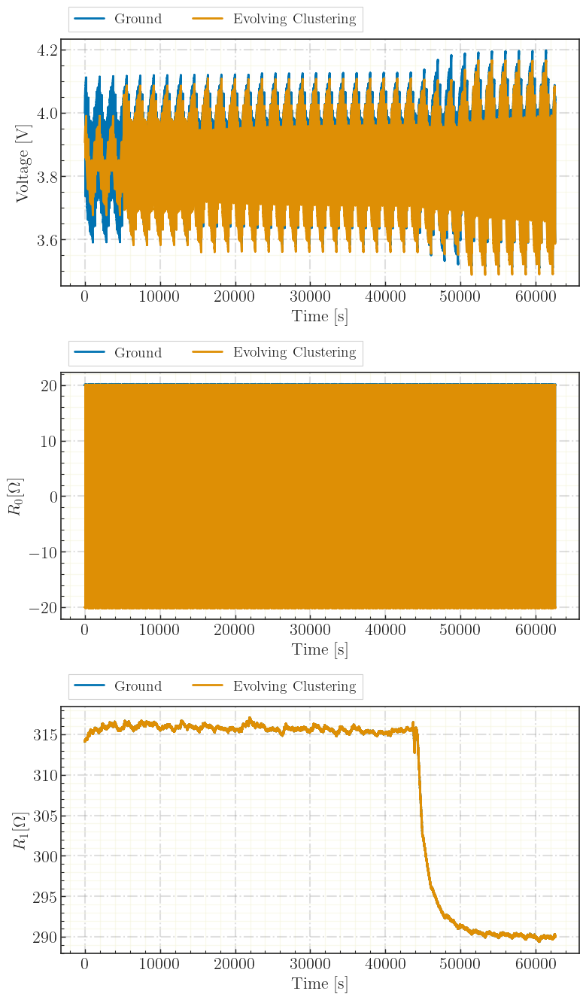

In [33]:
ernesto_plotter(**comparison_params)

In [34]:
single_params = {
    'dfs': [df_sim[500000:700000]], 
    'variables': ['soc', 'current', 'v_oc'], 
    'x_axes': ['time'] * 10,
    #'labels': ['Ground', 'Memoryless Adaptation', 'Evolving Clustering', 'Cluster Shift'],
    'labels': ['Ground', 'Evolving Clustering',],
    'x_labels': ['Time [s]'] * 10,
    'y_labels': [ 'SoC', 'Current', 'Voc'],
    'markers': [''] * 10,
    'line_styles': ['-', '-', '-.', '--'],
    'save_fig': False,
    'sampling_rate': 50,
    'colors': [plot_colors[0], plot_colors[1], plot_colors[2], plot_colors[4]],
    'plot_type': 'line',
    'dest': Path(folder), 
    'fig_name': f'OL-{exp_type}_tj{'-validation' if is_validation else ''}',
    'pic_format': 'pdf',
    'save_extend_bbox': (1.5,1.5),
    'figsize': (8, 4),
    'tick_font_size': 16,
    'label_font_size': 16,
    'legend_font_size': 14,
    'legend_ncol': 2,
    'legend_loc': 'lower left',
    'legend_bbox': (0, 1),
    'alphas':[1] * 5
}

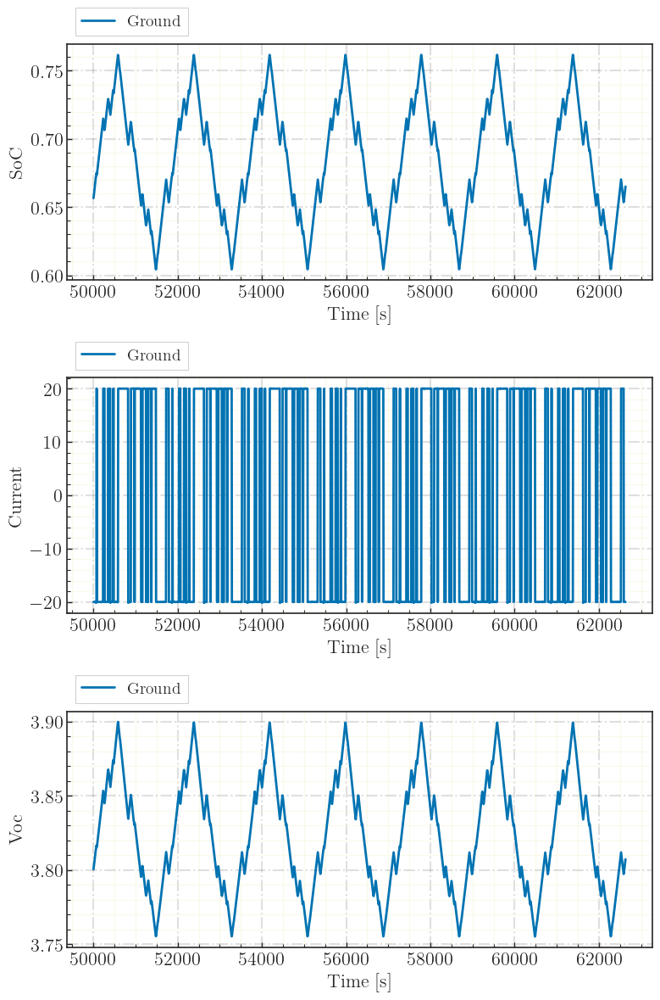

In [35]:
ernesto_plotter(**single_params)

In [36]:
df_sim

,time,soc,soh,c_max,voltage,current,power,v_oc,r0,r1,c1,v_r0,v_rc,i_r1,i_c,temperature,heat,t_amb,dVoc_dT
0,-1.0,0.716714,1.0,20.0,3.897220,0.0000,0.000000,0.000000,0.001830,0.002069,26290.432970,0.000000,0.000000,0.000000,0.000000,313.210000,0.000000,314.1596,-0.000007
1,0.0,0.716992,1.0,20.0,3.906809,-20.0101,78.175635,3.865270,0.002036,0.002390,24490.909512,-0.040735,-0.000803,-0.336122,-19.673978,313.276426,0.815384,314.1596,-0.000007
2,1.0,0.717020,1.0,20.0,3.907144,-19.9987,78.137805,3.865549,0.002036,0.002390,24490.909512,-0.040712,-0.000883,-0.369658,-19.629042,313.336892,0.814512,314.1596,-0.000007
3,1.1,0.717047,1.0,20.0,3.907288,-20.0101,78.185222,3.865589,0.002036,0.002390,24490.909512,-0.040735,-0.000964,-0.403155,-19.606945,313.392998,0.815502,314.1563,-0.000007
4,1.2,0.717075,1.0,20.0,3.907393,-20.0032,78.160368,3.865629,0.002036,0.002390,24490.909512,-0.040721,-0.001043,-0.436584,-19.566616,313.445268,0.815008,314.1563,-0.000007
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
626307,62631.5,0.665273,1.0,20.0,4.030470,-20.0055,80.631576,3.807367,0.009640,0.004214,16339.719885,-0.192849,-0.030254,-7.179673,-12.825827,290.111257,4.075260,290.0770,0.000012
626308,62631.6,0.665301,1.0,20.0,4.030527,-20.0009,80.614177,3.807390,0.009640,0.004214,16339.719885,-0.192805,-0.030332,-7.198267,-12.802633,290.109492,4.074612,290.0787,0.000012
626309,62631.7,0.665329,1.0,20.0,4.030629,-20.0009,80.616205,3.807414,0.009640,0.004214,16339.719885,-0.192805,-0.030410,-7.216834,-12.784066,290.107847,4.075740,290.0787,0.000012
626310,62631.8,0.665356,1.0,20.0,4.030819,-20.0101,80.657091,3.807437,0.009640,0.004214,16339.719885,-0.192894,-0.030489,-7.235388,-12.774712,290.110336,4.080418,290.1375,0.000012


In [213]:
# Adding sensor noise to voltage
rng = np.random.default_rng(seed=123)

snr_db = 10
rms = np.sqrt(np.mean(df_ground['voltage']**2))
sigma_from_snr = rms / (10**(snr_db/20))
v_noisy2 = df_ground['voltage'] + rng.normal(0, sigma_from_snr, size=df_ground['voltage'].shape)
print(sigma_from_snr)

1.2009316418909473


/var/folders/2j/2mbkhb5n5fg0fn1t37btqv140000gn/T/ipykernel_22955/1661696402.py:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


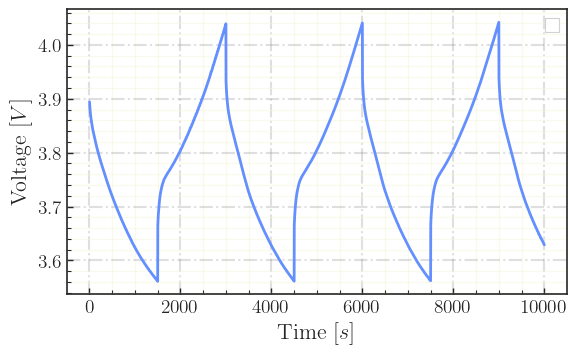

In [214]:
fig, ax = plt.subplots(figsize=(6, 3.75), tight_layout=True)
                       
ax.grid(visible=True, which='major', color='gray', alpha=0.25, linestyle='dashdot', lw=1.5)
ax.minorticks_on()
ax.grid(visible=True, which='minor', color='beige', alpha=0.5, ls='-', lw=1)

ax.plot(df_real['time'][1:10000], df_real['voltage'][1:10000], color="#648FFF")

ax.set_ylabel(r"Voltage $[V]$", fontsize=16)
ax.set_xlabel(r"Time $[s]$", fontsize=16)

ax.tick_params(axis='x', which='major', labelsize=14) 
ax.tick_params(axis='y', which='major', labelsize=14)

#ax.set_title("Error on Voltage")
ax.legend()
plt.tight_layout()

#plt.savefig(plot_folder + 'OL-voltage_without_noise.png')
plt.show()

/var/folders/2j/2mbkhb5n5fg0fn1t37btqv140000gn/T/ipykernel_22955/1682113221.py:24: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


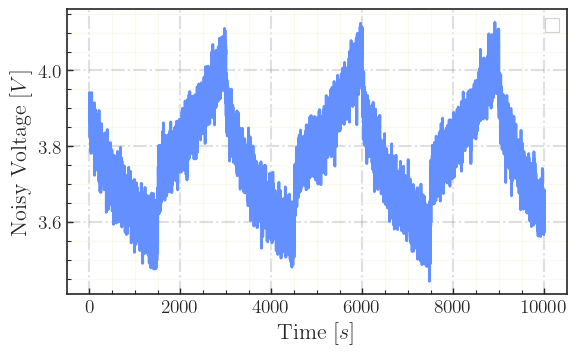

In [215]:
fig, ax = plt.subplots(figsize=(6, 3.75), tight_layout=True)
                       
ax.grid(visible=True, which='major', color='gray', alpha=0.25, linestyle='dashdot', lw=1.5)
ax.minorticks_on()
ax.grid(visible=True, which='minor', color='beige', alpha=0.5, ls='-', lw=1)

# Adding sensor noise to voltage
rng = np.random.default_rng(seed=123)

snr_db = 40
rms = np.sqrt(np.mean(df_real['voltage']**2))
sigma_from_snr = rms / (10**(snr_db/20))
v_noisy2 = df_real['voltage'] + rng.normal(0, sigma_from_snr, size=df_real['voltage'].shape)

ax.plot(df_real['time'][1:10000], v_noisy2[1:10000], color="#648FFF")

ax.set_ylabel(r"Noisy Voltage $[V]$", fontsize=16)
ax.set_xlabel(r"Time $[s]$", fontsize=16)

ax.tick_params(axis='x', which='major', labelsize=14) 
ax.tick_params(axis='y', which='major', labelsize=14)

#ax.set_title("Error on Voltage")
ax.legend()
plt.tight_layout()

#plt.savefig(plot_folder + 'OL-voltage_with_noise.png')
plt.show()

In [46]:
if is_validation:
    Verr_adaptive = (df_real['voltage'].values - df_sim['voltage'].values[1:])**2 
    Verr_passive = (df_real['voltage'].values - df_sim_passive['voltage'].values[1:])**2 
    Verr_fixed = (df_real['voltage'].values - df_fixed['voltage'].values[1:])**2
    Verr_clushift = (df_real['voltage'].values - df_sim_clushift['voltage'].values[1:])**2
else:
    Verr_adaptive = (df_real['voltage'].values[1:-1] - df_sim['voltage'].values[1:])**2 
    Verr_passive = (df_real['voltage'].values[1:-1] - df_sim_passive['voltage'].values[1:])**2 
    Verr_fixed = (df_real['voltage'].values[1:-1] - df_fixed['voltage'].values[1:])**2
    Verr_clushift = (df_real['voltage'].values[1:-1] - df_sim_clushift['voltage'].values[1:])**2

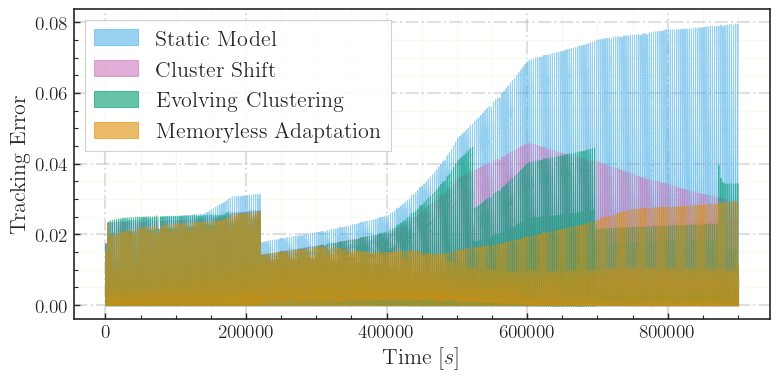

In [47]:
fig, ax = plt.subplots(figsize=(8, 4), tight_layout=True)
                       
ax.grid(visible=True, which='major', color='gray', alpha=0.25, linestyle='dashdot', lw=1.5)
ax.minorticks_on()
ax.grid(visible=True, which='minor', color='beige', alpha=0.5, ls='-', lw=1)


if is_validation:
    ax.fill_between(df_real['time'], Verr_fixed, [0]*len(df_real), label='Static Model', alpha=0.6, color=plot_colors[9])
    ax.fill_between(df_real['time'], Verr_clushift, [0]*len(df_real), label='Cluster Shift', alpha=0.6, color=plot_colors[4])
    ax.fill_between(df_real['time'], Verr_adaptive, [0]*len(df_real), label='Evolving Clustering', alpha=0.6, color=plot_colors[2])
    ax.fill_between(df_real['time'], Verr_passive, [0]*len(df_real), label='Memoryless Adaptation', alpha=0.6, color=plot_colors[1])
else:
    ax.fill_between(df_real['time'][1:-1], Verr_fixed, [0]*(len(df_real)-2), label='Static Model', alpha=0.6, color=plot_colors[9])
    ax.fill_between(df_real['time'][1:-1], Verr_clushift, [0]*(len(df_real)-2), label='Cluster Shift', alpha=0.6, color=plot_colors[4])
    ax.fill_between(df_real['time'][1:-1], Verr_adaptive, [0]*(len(df_real)-2), label='Evolving Clustering', alpha=0.6, color=plot_colors[2])
    ax.fill_between(df_real['time'][1:-1], Verr_passive, [0]*(len(df_real)-2), label='Memoryless Adaptation', alpha=0.6, color=plot_colors[1])

#if is_validation:
#    ax.plot(df_real['time'], Verr_fixed, label='Static Model', alpha=0.6, color=plot_colors[9])
#    ax.plot(df_real['time'], Verr_clushift, label='Cluster Shift', alpha=0.6, color=plot_colors[4])
#    ax.plot(df_real['time'], Verr_adaptive,  label='Evolving Clustering', alpha=0.6, color=plot_colors[2])
#    ax.plot(df_real['time'], Verr_passive, label='Memoryless Adaptation', alpha=0.6, color=plot_colors[1])
#else:
#    ax.plot(df_real['time'][1:-1], Verr_fixed, label='Static Model', alpha=0.6, color=plot_colors[9])
#    ax.plot(df_real['time'][1:-1], Verr_clushift, label='Cluster Shift', alpha=0.6, color=plot_colors[4])
#    ax.plot(df_real['time'][1:-1], Verr_adaptive, label='Evolving Clustering', alpha=0.6, color=plot_colors[2])
#    ax.plot(df_real['time'][1:-1], Verr_passive, label='Memoryless Adaptation', alpha=0.6, color=plot_colors[1])
    

ax.set_ylabel(r"Tracking Error", fontsize=16)
ax.set_xlabel(r"Time $[s]$", fontsize=16)

ax.tick_params(axis='x', which='major', labelsize=14) 
ax.tick_params(axis='y', which='major', labelsize=14)

#ax.set_title("Error on Voltage")
ax.legend(loc='upper left', fontsize=16)
plt.tight_layout()

#plt.savefig(plot_folder + f'OL-{exp_type}_tj{'_validation' if is_validation else ''}_error.png')
plt.show()

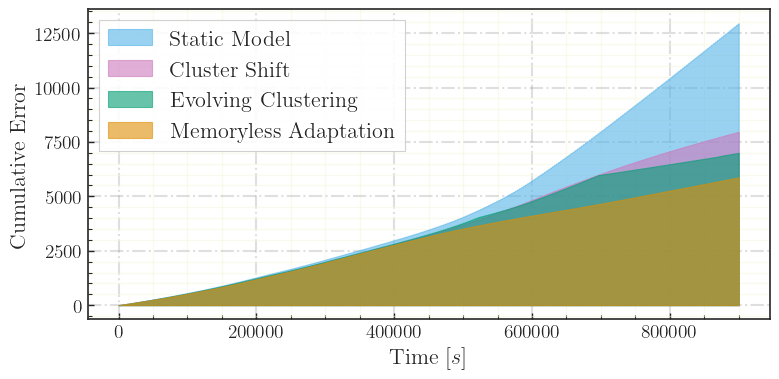

In [48]:
fig, ax = plt.subplots(figsize=(8, 4), tight_layout=True)

ax.grid(visible=True, which='major', color='gray', alpha=0.25, linestyle='dashdot', lw=1.5)
ax.minorticks_on()
ax.grid(visible=True, which='minor', color='beige', alpha=0.5, ls='-', lw=1)

if is_validation:
    ax.fill_between(df_real['time'], np.cumsum(Verr_fixed), [0]*len(df_real), label='Static Model', alpha=0.6, color=plot_colors[9])
    ax.fill_between(df_real['time'], np.cumsum(Verr_clushift), [0]*len(df_real), label='Cluster Shift', alpha=0.6, color=plot_colors[4])
    ax.fill_between(df_real['time'], np.cumsum(Verr_adaptive), [0]*len(df_real), label='Evolving Clustering', alpha=0.6, color=plot_colors[2])
    ax.fill_between(df_real['time'], np.cumsum(Verr_passive), [0]*len(df_real), label='Memoryless Adaptation', alpha=0.6, color=plot_colors[1])
else:
    ax.fill_between(df_real['time'][1:-1], np.cumsum(Verr_fixed), [0]*(len(df_real)-2), label='Static Model', alpha=0.6, color=plot_colors[9])
    ax.fill_between(df_real['time'][1:-1], np.cumsum(Verr_clushift), [0]*(len(df_real)-2), label='Cluster Shift', alpha=0.6, color=plot_colors[4])
    ax.fill_between(df_real['time'][1:-1], np.cumsum(Verr_adaptive), [0]*(len(df_real)-2), label='Evolving Clustering', alpha=0.6, color=plot_colors[2])
    ax.fill_between(df_real['time'][1:-1], np.cumsum(Verr_passive), [0]*(len(df_real)-2), label='Memoryless Adaptation', alpha=0.6, color=plot_colors[1])

ax.set_ylabel(r"Cumulative Error", fontsize=16)
ax.set_xlabel(r"Time $[s]$", fontsize=16)

ax.tick_params(axis='x', which='major', labelsize=14) 
ax.tick_params(axis='y', which='major', labelsize=14)

#ax.set_title("Cumulative Error on Voltage")
ax.legend(loc='upper left', fontsize=16)
plt.tight_layout()

#plt.savefig(plot_folder + f'OL-{exp_type}_tj{'_validation' if is_validation else ''}_cumerror.png')
plt.show()

In [49]:
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def calculate_metrics(y_true, y_pred, name):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    r2 = r2_score(y_true, y_pred)
    
    print(f"--- {name} ---")
    print(f"MSE:  {mse:.2e}")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE:  {mae:.4f}")
    print(f"MAPE: {mape:.2f}%")
    print(f"R^2:  {r2:.4f}\n")

# Assuming you have your data loaded as numpy arrays:
if is_validation:
    calculate_metrics(df_real['voltage'].values, df_sim_passive['voltage'].values[1:], "Memoryless Adaptation")
    calculate_metrics(df_real['voltage'].values, df_sim_clushift['voltage'].values[1:], "Cluster Shift")
    calculate_metrics(df_real['voltage'].values, df_sim['voltage'].values[1:], "Evolving Clustering")
    calculate_metrics(df_real['voltage'].values, df_fixed['voltage'].values[1:], "Static Model")
else:
    calculate_metrics(df_real['voltage'].values[1:-1], df_sim_passive['voltage'].values[1:], "Memoryless Adaptation")
    calculate_metrics(df_real['voltage'].values[1:-1], df_sim_clushift['voltage'].values[1:], "Cluster Shift")
    calculate_metrics(df_real['voltage'].values[1:-1], df_sim['voltage'].values[1:], "Evolving Clustering")
    calculate_metrics(df_real['voltage'].values[1:-1], df_fixed['voltage'].values[1:], "Static Model")

--- Memoryless Adaptation ---
MSE:  6.52e-03
RMSE: 0.0808
MAE:  0.0738
MAPE: 1.95%
R^2:  0.8162

--- Cluster Shift ---
MSE:  8.85e-03
RMSE: 0.0941
MAE:  0.0807
MAPE: 2.08%
R^2:  0.7507

--- Evolving Clustering ---
MSE:  7.78e-03
RMSE: 0.0882
MAE:  0.0774
MAPE: 2.01%
R^2:  0.7809

--- Static Model ---
MSE:  1.44e-02
RMSE: 0.1200
MAE:  0.1015
MAPE: 2.63%
R^2:  0.5945



## Plotting the evolution of parameters

In [281]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import pandas as pd
import numpy as np

def static_plot3d(X: pd.DataFrame, 
                             params: list, 
                             original: pd.DataFrame, 
                             faulty_clusters: dict):
    """
    Static 3D visualization of adaptive clustering (Matplotlib version).
    Replicates the final frame of the Plotly animation with publication styling.
    """
    # Extract parameters for readability
    x_col, y_col, z_col = params

    fig = plt.figure(figsize=(12, 10), dpi=120)
    ax = fig.add_subplot(111, projection='3d')

    # Remove gray panes for a clean look
    ax.xaxis.pane.fill = True
    ax.yaxis.pane.fill = True
    ax.zaxis.pane.fill = True
    ax.xaxis.pane.set_edgecolor('w')
    ax.yaxis.pane.set_edgecolor('w')
    ax.zaxis.pane.set_edgecolor('w')

    # --- 2. Plot Logic ---

    # A. Nominal Reference Cluster (Background)
    # Using 'original' dataframe
    if not original.empty:
        ax.scatter(
            original[x_col], 
            original[y_col], 
            original[z_col],
            color='blue',
            label=r'Nominal $\Theta_0$',
            s=15,
            alpha=1,            # Very faint to serve as background context
            edgecolors='none'
        )

    # B. Inliers (from current evolution X)
    # Logic: is_outlier == False AND active_cluster == 'nominal_temp_40'
    inliers = X[(X['is_outlier'] == False) & (X['active_cluster'] == 'nominal_temp_40')]
    if not inliers.empty:
        ax.scatter(
            inliers[x_col], 
            inliers[y_col], 
            inliers[z_col],
            color='blue',
            label='Inliers',
            s=20,
            alpha=0.4,
            edgecolors='none'
        )

    # C. Faulty Clusters (Iterate through dictionary)
    # Colors matching your Plotly snippet
    colors = ['green', 'orange', 'purple', 'violet', 'magenta', 'lime']
    
    # We need to collect times to filter 'pure' outliers later
    faulty_times = []

    for i, (key, fc_df) in enumerate(faulty_clusters.items()):
        faulty_times.extend(fc_df['time'].tolist())
        
        # Cycle through colors if there are more clusters than colors
        c = colors[i % len(colors)]
        
        ax.scatter(
            fc_df[x_col],
            fc_df[y_col],
            fc_df[z_col],
            color=c,
            label=fr'$\Theta_{i+1}$',
            s=40,
            alpha=0.8,
            edgecolors='white',    # White edge to pop
            linewidth=0.5
        )

    # D. Unassigned Outliers
    # Logic: is_outlier == True AND time NOT in faulty_times
    # (i.e., points that were flagged as outliers but didn't form a stable cluster)
    outliers = X[(X['is_outlier'] == True) & (~X['time'].isin(faulty_times))]
    
    if not outliers.empty:
        ax.scatter(
            outliers[x_col],
            outliers[y_col],
            outliers[z_col],
            color='red',
            label='Unassigned Outliers',
            s=25,
            marker='x',            # distinct marker for noise
            alpha=0.6,
            linewidth=1.0
        )

    # --- 4. Labels and View ---
    ax.set_xlabel(r'$R_0 \, [\Omega]$', labelpad=10, fontsize=16, fontweight='bold')
    ax.set_ylabel(r'$R_1 \, [\Omega]$', labelpad=10, fontsize=16, fontweight='bold')
    ax.set_zlabel(r'$C_1 \, [F]$', fontsize=16, labelpad=10, fontweight='bold')

    # Increase the padding of the tick numbers themselves so they don't touch the axis line
    ax.tick_params(axis='z', which='major', pad=8, labelsize=14) 
    ax.tick_params(axis='x', which='major', labelsize=14)
    ax.tick_params(axis='y', which='major', labelsize=14)
    
    # Adjust view angle for best perspective (Adjust these numbers to rotate the plot)
    ax.view_init(elev=25, azim=135)
    
    # Legend
    ax.legend(
        frameon=True, 
        fancybox=True, 
        framealpha=0.5, 
        edgecolor='black',
        loc='upper center', 
        bbox_to_anchor=(0.5, 0.9), 
        fontsize=18,
        handletextpad=0.1
    )
    
    plt.tight_layout()
    #plt.savefig(plot_folder + f'OL-{exp_type}_tj{'-validation' if is_validation else ''}-cluster-evolution3D.png')

    plt.show()

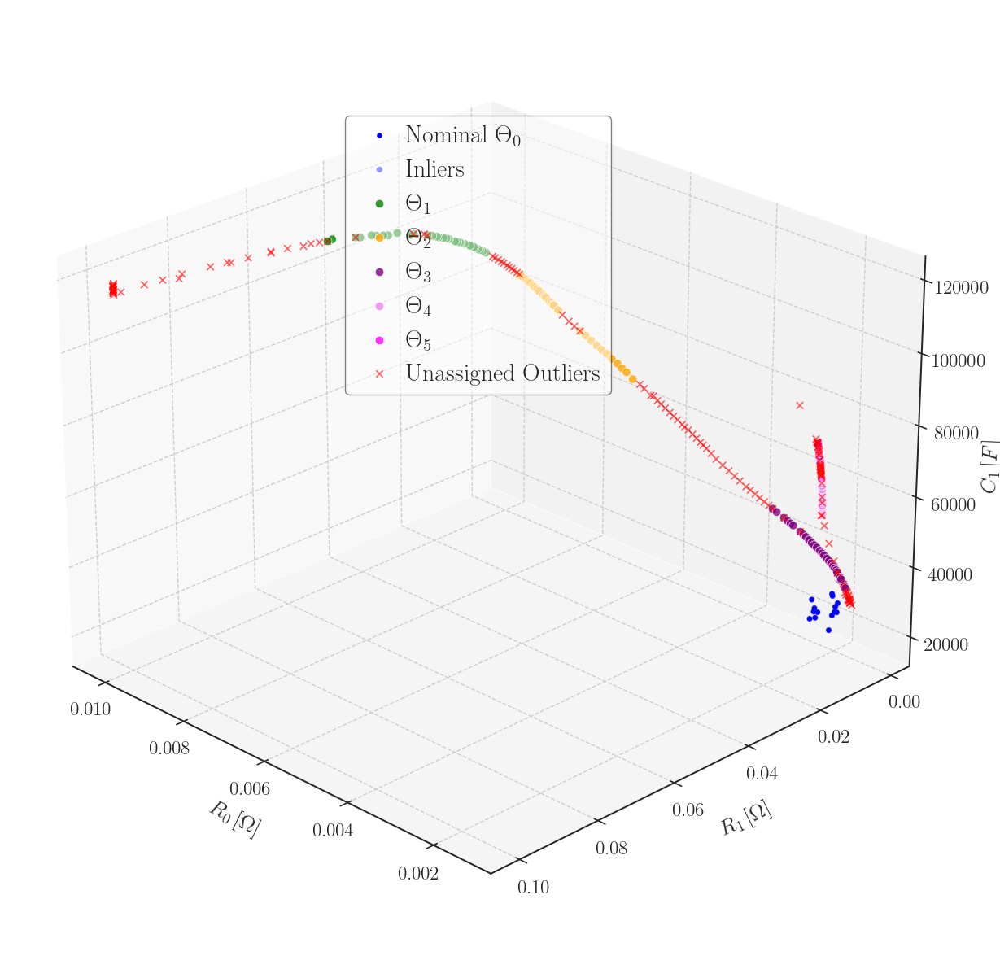

In [282]:
static_plot3d(
    X=df_samples,
    params=["r0", "r1", "c1"],
    original=df_samples[df_samples['time'] == 0],
    faulty_clusters={key: df for key, df in dfs_clusters.items() if 'nominal' not in key}
)

In [37]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def static_params_over_time(X: pd.DataFrame, 
                            params: list, 
                            original: pd.DataFrame, 
                            faulty_clusters: dict):
    """
    Static 2D visualization of parameter evolution over time (Matplotlib version).
    Creates stacked subplots for each parameter with publication styling.
    """
    window_size = 3000
    
    # Create subplots: One row per parameter, sharing the X-axis (Time)
    fig, axes = plt.subplots(
        nrows=len(params), 
        ncols=1, 
        figsize=(8, 2.5 * len(params)), # Adjust height dynamically
        sharex=True, 
        dpi=120
    )
    
    param_names = [r'$R_0 \,[\Omega]$', r'$R_1 \,[\Omega]$', r'$C_1 \,[F]$']
    
    # Ensure axes is always a list (even if only 1 param)
    if len(params) == 1:
        axes = [axes]

    # C. Faulty Clusters (Iterate through dictionary)
    # Colors matching your Plotly snippet
    colors = ['green', 'orange', 'purple', 'violet', 'magenta', 'lime']
    

    # --- 2. Iterate over each Parameter ---
    for idx, param in enumerate(params):
        ax = axes[idx]
        
        # A. Plot Nominal Reference (Background)
        if not original.empty and param in original.columns:
            ax.scatter(
                original["time"] * window_size, 
                original[param], 
                c='blue', 
                s=10, 
                alpha=1, 
                label=r'Nominal $\Theta_0$' if idx == 0 else "_nolegend_",
                edgecolors='none'
            )

        # B. Plot Inliers (Current Evolution)
        # Logic: is_outlier == False AND active_cluster == 'nominal_temp_40'
        inliers = X[(X['is_outlier'] == False) & (X['active_cluster'] == 'nominal_temp_40')]
        if not inliers.empty and param in inliers.columns:
            ax.scatter(
                inliers["time"] * window_size, 
                inliers[param], 
                c='blue', 
                s=15, 
                alpha=0.4, 
                label='Inliers' if idx == 0 else "_nolegend_",
                edgecolors='none'
            )

        # C. Plot Faulty Clusters
        faulty_times = []
        for i, (key, df) in enumerate(faulty_clusters.items()):
            if param in df.columns:
                ax.axvline(x=df_samples[df_samples['active_cluster'] == key]['time'].iloc[0] * window_size, color='red',  linestyle='--', linewidth=1)
                faulty_times.extend(df['time'].tolist())
                
                # Pick unique color
                c = colors[i % len(colors)]
                
                ax.scatter(
                    df["time"] * window_size,
                    df[param],
                    color=c,
                    s=25,
                    alpha=0.8,
                    label=fr'$\Theta_{i+1}$',
                    edgecolors='white',
                    linewidth=0.5
                )

        # D. Plot Unassigned Outliers
        # Logic: Outliers that are NOT part of a known faulty cluster yet
        outliers = X[(X['is_outlier'] == True) & (~X['time'].isin(faulty_times))]
        if not outliers.empty and param in outliers.columns:
            ax.scatter(
                outliers["time"] * window_size,
                outliers[param],
                c='red',
                marker='x',
                s=20,
                alpha=0.6,
                label='Unassigned Outliers' if idx == 0 else "_nolegend_"
            )

        # Labels & Formatting per subplot
        ax.set_ylabel(param_names[idx], fontweight='bold', fontsize=16, labelpad=10)
        
        # Increase the padding of the tick numbers themselves so they don't touch the axis line
        ax.tick_params(axis='x', which='major', labelsize=14)
        ax.tick_params(axis='y', which='major', labelsize=14)
        
        # Remove top/right spines for cleaner look
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

    # --- 3. Final Layout Touches ---
    
    # Only set X-label on the bottom-most plot
    axes[-1].set_xlabel(r"Time $[s]$", fontweight='bold', labelpad=10)

    # Unified Legend (collected from the first subplot)
    # We place it above the top subplot
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(
        handles, 
        labels, 
        loc='upper center', 
        fontsize=16,
        bbox_to_anchor=(0.5, 0.95), 
        ncol=4, 
        frameon=True,
        fancybox=True,
        handletextpad=0.01,
        columnspacing=0.7,
        markerscale=1.5
    )

    # Adjust layout to make room for title and legend
    plt.tight_layout(rect=[0, 0, 1, 0.88]) 
    #plt.savefig(plot_folder + f'OL-{exp_type}_tj{'_validation' if is_validation else ''}-cluster-evolution-over-time.png')
    plt.show()

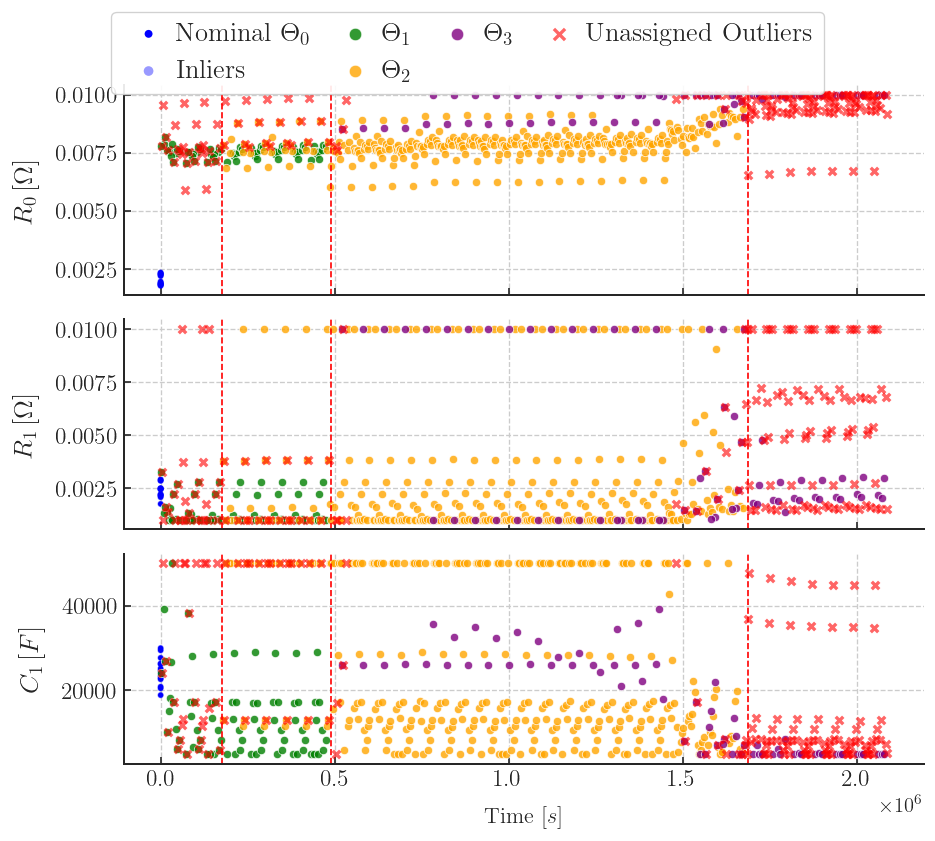

In [38]:
static_params_over_time(
    X=df_samples,
    params=["r0", "r1", "c1"],
    original=df_samples[df_samples['time'] == 0],
    faulty_clusters={key: df for key, df in sorted(dfs_clusters.items()) if 'nominal' not in key}
)

## Interactive plots with plotly

In [369]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

def animated_plot3d(X: pd.DataFrame, 
                    params: list, 
                    original: pd.DataFrame, 
                    faulty_clusters: dict):
    """
    Animated 3D visualization of adaptive clustering over time.
    Shows nominal and faulty clusters statically, and samples evolving dynamically.
    """    
    # Extract parameters for readability
    x_col, y_col, z_col = params

    # --- Base static traces ---
    traces = []

    # Nominal cluster (blue)
    traces.append(go.Scatter3d(
        x=original[x_col],
        y=original[y_col],
        z=original[z_col],
        mode='markers',
        marker=dict(size=3, color='blue', opacity=0.5),
        name='Nominal Cluster'
    ))
    
    # Inliers
    inliers = X[(X['is_outlier'] == False) & (X['active_cluster'] == 'nominal_temp_40')]
    traces.append(go.Scatter3d(
        x=inliers[x_col],
        y=inliers[y_col],
        z=inliers[z_col],
        mode='markers',
        marker=dict(size=3, color='blue', opacity=0.5),
        name='Inliers'
    ))

    # Outliers
    faulty_times = []
    for key, clu in faulty_clusters.items():
        faulty_times.extend(clu['time'])
    
    outliers = X[(X['is_outlier'] == True) & (~X['time'].isin(faulty_times))]
    traces.append(go.Scatter3d(
        x=outliers[x_col],
        y=outliers[y_col],
        z=outliers[z_col],
        mode='markers',
        marker=dict(size=3, color='red', opacity=0.5),
        name='Outliers'
    ))
    
    # Faulty clusters (red/orange/purple)
    colors = ['green', 'orange', 'purple', 'violet', 'grey']
    for i, (k, fc) in enumerate(faulty_clusters.items()):
        traces.append(go.Scatter3d(
            x=fc[x_col],
            y=fc[y_col],
            z=fc[z_col],
            mode='markers',
            marker=dict(size=3, color=colors[i], opacity=0.5),
            name=f'{k}'
        ))

    # --- Create animation frames ---
    frames = []
    times = sorted(X['time'].unique())

    for t in times:
        frame_data = []

        df_t = X[X['time'] <= t]

        # Split by cluster type
        nominal_points = df_t[df_t['cluster'].str.startswith('nominal', na=False)]
        active_clusters = set(df_t['active_cluster'].dropna())
        outliers = df_t[df_t['is_outlier'] == True].copy()
    
        # Filter outliers that are already assigned to a faulty cluster
        mask_assigned = pd.Series(False, index=outliers.index)
        for clu in active_clusters:
            if clu in dfs_clusters:
                cluster_times = dfs_clusters[clu][dfs_clusters[clu]['time'] <= t]['time'].to_numpy()
                mask_assigned |= outliers['time'].isin(cluster_times)

        # Keep only unassigned outliers
        outliers = outliers[~mask_assigned]
        
        # Add cumulative nominal points (blue)
        frame_data.append(go.Scatter3d(
            x=nominal_points[x_col],
            y=nominal_points[y_col],
            z=nominal_points[z_col],
            mode='markers',
            marker=dict(size=4, color='blue', opacity=0.4),
            name='Nominal Samples'
        ))

        # Inliers
        inliers_t = df_t[(df_t['is_outlier'] == False) & (df_t['active_cluster'] == 'nominal_temp_40')]
        frame_data.append(go.Scatter3d(
            x=inliers_t[x_col],
            y=inliers_t[y_col],
            z=inliers_t[z_col],
            mode='markers',
            marker=dict(size=4, color='blue', opacity=0.4),
            name='Nominal inliers'
        ))
        
        # Add cumulative outliers points (red)
        frame_data.append(go.Scatter3d(
            x=outliers[x_col],
            y=outliers[y_col],
            z=outliers[z_col],
            mode='markers',
            marker=dict(size=5, color='red', opacity=0.4, symbol='circle'),
            name='Outliers'
        ))
        
        # Add cumulative faulty points (orange)
        for i, (key, df) in enumerate(faulty_clusters.items()):
            faulty_points = df_t[df_t['active_cluster'] == key]
            frame_data.append(go.Scatter3d(
                x=faulty_points[x_col],
                y=faulty_points[y_col],
                z=faulty_points[z_col],
                mode='markers',
                marker=dict(size=5, color=colors[i], opacity=0.6, symbol='circle'),
                name=f'{key}'
            ))

        frames.append(go.Frame(data=frame_data, name=str(t)))

    # --- Build figure layout ---
    layout = go.Layout(
        width=1000,
        height=750,
        title="Adaptive Clustering Evolution (Animated)",
        scene=dict(
            xaxis_title=x_col,
            yaxis_title=y_col,
            zaxis_title=z_col,
        ),
        showlegend=True,
        updatemenus=[{
            "buttons": [
                {
                    "args": [None, {"frame": {"duration": 500, "redraw": True},
                                    "fromcurrent": True,
                                    "mode": "immediate"}],
                    "label": "▶️ Play",
                    "method": "animate"
                },
                {
                    "args": [[None], {"frame": {"duration": 0, "redraw": False},
                                      "mode": "immediate"}],
                    "label": "⏸️ Pause",
                    "method": "animate"
                }
            ],
            "direction": "left",
            "pad": {"r": 10, "t": 50},
            "showactive": True,
            "type": "buttons",
            "x": 0.1,
            "xanchor": "right",
            "y": 0,
            "yanchor": "top"
        }],
        sliders=[{
            "steps": [
                {
                    "args": [[str(t)], {"frame": {"duration": 0, "redraw": True},
                                        "mode": "immediate"}],
                    "label": str(t),
                    "method": "animate"
                } for t in times
            ],
            "x": 0.1,
            "len": 0.9,
            "xanchor": "left",
            "y": -0.05,
            "yanchor": "top"
        }]
    )

    # --- Assemble and show figure ---
    fig = go.Figure(data=traces, layout=layout, frames=frames)
    fig.show()

In [ ]:
animated_plot3d(
    X=df_samples,
    params=["r0", "r1", "c1"],
    original=df_samples[df_samples['time'] == 0],
    faulty_clusters={key: df for key, df in dfs_clusters.items() if 'nominal' not in key}
)

In [371]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def animated_params_vs_time(X: pd.DataFrame,
                            params: list,
                            original: pd.DataFrame,
                            faulty_clusters: dict):
    """
    Animated time evolution of each parameter (1D per subplot),
    showing nominal, faulty, and outlier values over time.
    """
    times = sorted(X['time'].unique())
    colors_list = ['green', 'orange', 'pink', 'light blue', 'purple', 'violet', 'magenta', 'cyan']

    # --- Base figure with 3 rows (one per parameter) ---
    fig = make_subplots(
        rows=3, cols=1,
        shared_xaxes=True,
        vertical_spacing=0.05
    )

    # --- Static background (nominal, outlier, faulty) ---
    for i, param in enumerate(params, start=1):
        # Nominal
        fig.add_trace(go.Scatter(
            x=original["time"],
            y=original[param],
            mode="markers",
            marker=dict(size=4, color="blue", opacity=0.4),
            name="Nominal",
            legendgroup="nominal"
        ), row=i, col=1)

        # Inliers
        inliers = X[(X['is_outlier'] == False) & (X['active_cluster'] == 'nominal_temp_40')]
        fig.add_trace(go.Scatter(
            x=inliers["time"],
            y=inliers[param],
            mode="markers",
            marker=dict(size=4, color="blue", opacity=0.4),
            name="Inliers",
            legendgroup="inliers"
        ), row=i, col=1)

        # Outliers
        faulty_times = []
        for key, clu in faulty_clusters.items():
            faulty_times.extend(clu['time'])
            
        outliers = X[(X['is_outlier'] == True) & (~X['time'].isin(faulty_times))]
        fig.add_trace(go.Scatter(
            x=outliers["time"],
            y=outliers[param],
            mode="markers",
            marker=dict(size=4, color="red", opacity=0.5),
            name="Outliers",
            legendgroup="outliers"
        ), row=i, col=1)

        # Faulty clusters
        for j, (key, df) in enumerate(faulty_clusters.items()):
            if param in df.columns:
                fig.add_trace(go.Scatter(
                    x=df["time"],
                    y=df[param],
                    mode="markers",
                    marker=dict(size=4, color=colors_list[j], opacity=0.5),
                    name=key,
                    legendgroup=key
                ), row=i, col=1)

    # --- Build animation frames ---
    frames = []
    for t in times:
        df_t = X[X["time"] <= t].copy()

        # Split
        nominal_points = df_t[df_t["cluster"].str.startswith("nominal", na=False)]
        outliers = df_t[df_t["is_outlier"] == True]
        active_clusters = set(df_t["active_cluster"].dropna())

        # Filter outliers already assigned to a faulty cluster
        mask_assigned = pd.Series(False, index=outliers.index)
        for clu in active_clusters:
            if clu in faulty_clusters:
                cluster_times = faulty_clusters[clu][faulty_clusters[clu]["time"] <= t]["time"].to_numpy()
                mask_assigned |= outliers["time"].isin(cluster_times)
        outliers_unassigned = outliers[~mask_assigned]

        frame_data = []
        for i, param in enumerate(params, start=1):
            
            # Nominal points (blue)
            frame_data.append(go.Scatter(
                x=nominal_points["time"],
                y=nominal_points[param],
                mode="markers",
                marker=dict(size=4, color="blue", opacity=0.5),
                name="Nominal",
                legendgroup="nominal"
            ))

            # inliers (up to t)
            inliers_t = df_t[(df_t['is_outlier'] == False) & (df_t['active_cluster'] == 'nominal_temp_40')]
            frame_data.append(go.Scatter(
                x=inliers_t["time"], 
                y=inliers_t[param], 
                mode="markers",
                marker=dict(size=4, color="blue", opacity=0.4),
                name="Inliers", 
                legendgroup="inliers"
            ))

            # Outliers (red)
            frame_data.append(go.Scatter(
                x=outliers_unassigned["time"],
                y=outliers_unassigned[param],
                mode="markers",
                marker=dict(size=4, color="red", symbol="diamond", opacity=0.7),
                name="Outliers",
                legendgroup="outliers"
            ))

            # Faulty clusters
            for j, (key, df) in enumerate(faulty_clusters.items()):
                faulty_points = df[df["time"] <= t]
                frame_data.append(go.Scatter(
                    x=faulty_points["time"],
                    y=faulty_points[param],
                    mode="markers",
                    marker=dict(size=5, color=colors_list[j], opacity=0.7),
                    name=key,
                    legendgroup=key
                ))

        frames.append(go.Frame(data=frame_data, name=str(t)))

    # --- Layout & controls ---
    fig.update_layout(
        height=900,
        title_text="Parameter Evolution over Time (Animated)",
        xaxis3_title="Time",
        showlegend=True,
        updatemenus=[{
            "buttons": [
                {
                    "args": [None, {"frame": {"duration": 500, "redraw": True},
                                    "fromcurrent": True,
                                    "mode": "immediate"}],
                    "label": "▶️ Play",
                    "method": "animate"
                },
                {
                    "args": [[None], {"frame": {"duration": 0, "redraw": False},
                                      "mode": "immediate"}],
                    "label": "⏸️ Pause",
                    "method": "animate"
                }
            ],
            "direction": "left",
            "pad": {"r": 10, "t": 60},
            "showactive": True,
            "type": "buttons",
            "x": 0.1,
            "xanchor": "right",
            "y": 1.15,
            "yanchor": "top"
        }],
        sliders=[{
            "steps": [
                {
                    "args": [[str(t)], {"frame": {"duration": 0, "redraw": True},
                                        "mode": "immediate"}],
                    "label": str(t),
                    "method": "animate"
                } for t in times
            ],
            "x": 0.1,
            "len": 0.9,
            "xanchor": "left",
            "y": -0.05,
            "yanchor": "top"
        }]
    )

    # --- Build final animated figure ---
    fig.frames = frames
    fig.show()

In [372]:
animated_params_vs_time(
    X=df_samples,
    params=["r0", "r1", "c1"],
    original=df_samples[df_samples['time'] == 0],
    faulty_clusters={key: df for key, df in dfs_clusters.items() if 'nominal' not in key}
)